In [2]:
import numpy as np
import pandas as pd

import dask.dataframe as dd

import matplotlib.pyplot as plt

import glob

import os

# Read Data

In [3]:
# meta data
train = pd.read_csv("data/train.csv")
train

,segment_id,time_to_eruption
0,1136037770,12262005
1,1969647810,32739612
2,1895879680,14965999
3,2068207140,26469720
4,192955606,31072429
...,...,...
4426,873340274,15695097
4427,1297437712,35659379
4428,694853998,31206935
4429,1886987043,9598270


In [4]:
# Sort data by time to eruption
sorted_train = train.sort_values("time_to_eruption",ascending=False)
sorted_train

,segment_id,time_to_eruption
1139,1923243961,49046087
3509,1552761888,48814294
3589,356854390,48727004
3739,1131527270,48522449
4132,1162128945,48387290
...,...,...
1724,1626437563,40492
413,442994108,28696
1145,1957235969,26929
2709,1658693785,25730


In [5]:
# meta data for test
test_ = pd.DataFrame([os.path.basename(f)[:-4] for f in glob.glob('data/test/*')], columns=["segment_id"])
test_

,segment_id
0,1000213997
1,100023368
2,1000488999
3,1001028887
4,1001857862
...,...
4515,996704281
4516,997630809
4517,998072137
4518,998136924


# Exploratory Data Analysis

<AxesSubplot:ylabel='Frequency'>

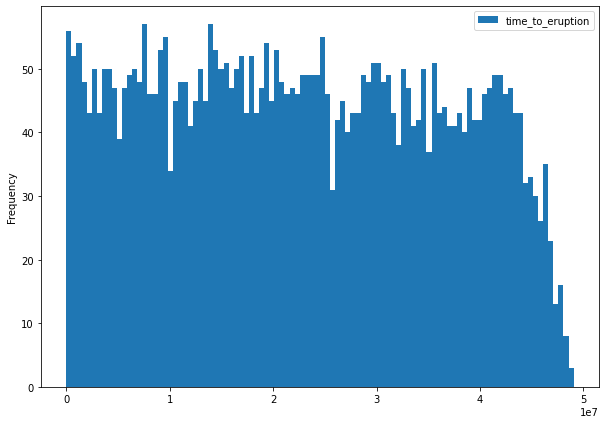

In [6]:
# See time to eruption distribution -> Roughly uniform distribution

sorted_train[["time_to_eruption"]].plot(kind="hist",bins=100,figsize=(10,7))

In [7]:
# Max and Min data
display(sorted_train.iloc[[0,-1],:])

max_id = 1923243961
min_id =  601524801

,segment_id,time_to_eruption
1139,1923243961,49046087
590,601524801,6250


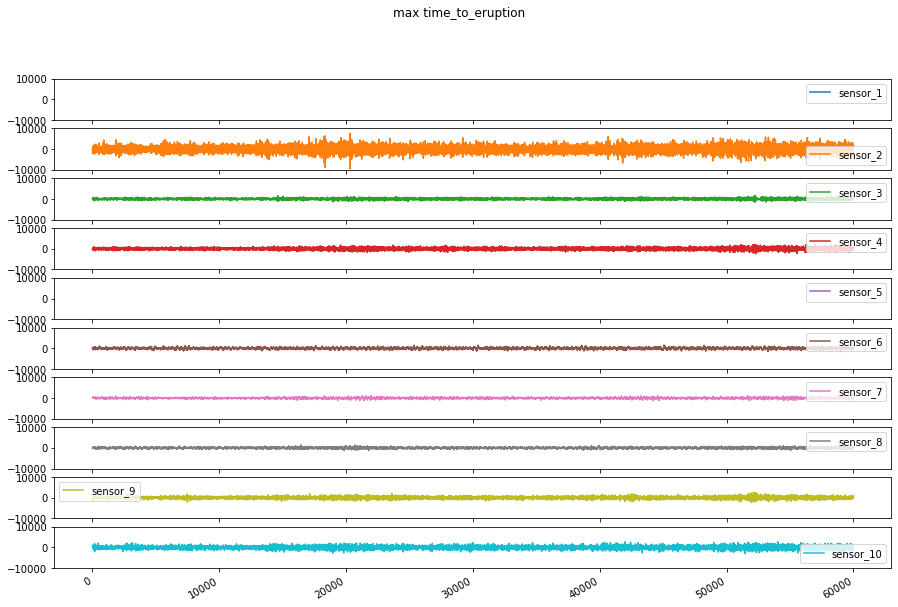

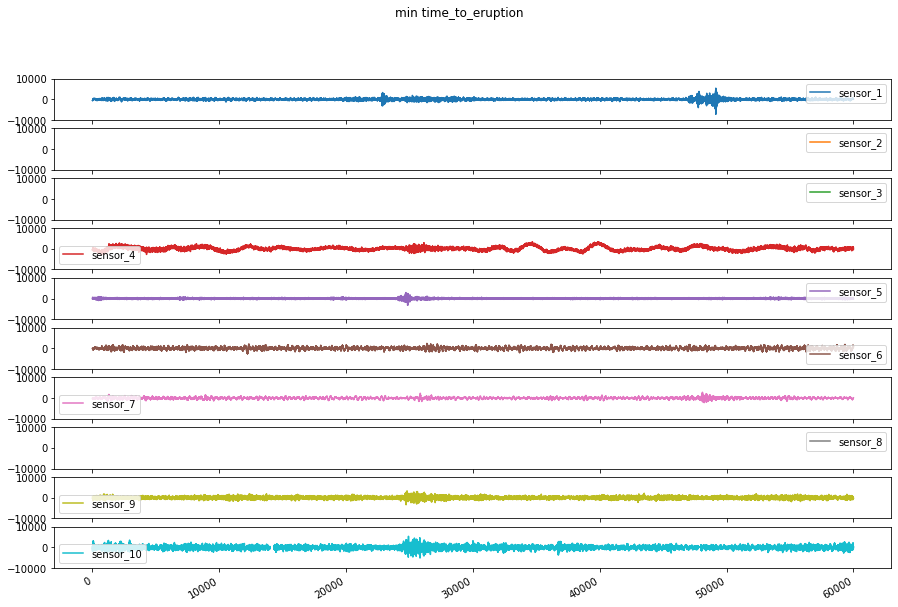

In [10]:
# Plot the first (probably normal) and the last (probably abnormal) raw signal data -> Looks different

pd.read_csv(f"data/train/{max_id}.csv").plot(figsize=(15,10),title="max time_to_eruption",subplots=True,ylim=(-10000,10000))
plt.show()


pd.read_csv(f"data/train/{min_id}.csv").plot(figsize=(15,10),title="min time_to_eruption",subplots=True,ylim=(-10000,10000))
plt.show()

In [11]:
# Check NaN data -> Some Sensors are completely empty.

display(pd.read_csv(f"data/train/{max_id}.csv").isnull().sum())

display(pd.read_csv(f"data/train/{min_id}.csv").isnull().sum())

sensor_1     60001
sensor_2         0
sensor_3         0
sensor_4         0
sensor_5     60001
sensor_6         0
sensor_7         0
sensor_8         0
sensor_9         0
sensor_10        0
dtype: int64

sensor_1         0
sensor_2     60001
sensor_3     60001
sensor_4         0
sensor_5         0
sensor_6         0
sensor_7         0
sensor_8     60001
sensor_9         0
sensor_10      722
dtype: int64

# Feature Extraction

In [12]:
# Define feature extraction function

fs = ["_mean","_std","_max","_min","_mad","_skew","_kurt","_nunique",
      "_quantile_05","_quantile_10","_quantile_30","_quantile_70","_quantile_90","_quantile_95",
      "_fft_power_mean","_fft_power_std","_fft_power_min","_fft_power_max",
      "_fft_power_sum_low","_fft_power_sum_middle","_fft_power_sum_high",
      "_fft_power_mad","_fft_power_skew","_fft_power_kurt","_fft_power_nunique",
      "_fft_power_quantile_05","_fft_power_quantile_10","_fft_power_quantile_30","_fft_power_quantile_70",
      "_fft_power_quantile_90","_fft_power_quantile_95",
      "_cross_0_count",
      "_roll_mean_min","_roll_mean_max","_roll_dist_min","_roll_dist_max","_roll_dist_diff_min","_roll_dist_diff_max"
     ]

def extract(segment_id,dir_="train"):
    """
    Extract statistical features for each sensor signal
    
    - Mean
    - Standard Deviation
    - Maximum
    - Minimum
    - Mean Absolute Deviation
    - Skewness
    - Kurtosis
    - Median
    - Mode
    - (Unbiased) Standard Error of the Mean
    - Number of Unique Values
    """
    f = pd.read_csv(f"data/{dir_}/{segment_id}.csv")
    
    # Fill NaN
    f.interpolate(axis=0,inplace=True)
    
    # Quantile
    q005 = f.quantile(0.05,axis=0)
    q010 = f.quantile(0.1 ,axis=0)
    q030 = f.quantile(0.3 ,axis=0)
    q070 = f.quantile(0.7 ,axis=0)
    q090 = f.quantile(0.9 ,axis=0)
    q095 = f.quantile(0.95,axis=0)
    
    # Rolling
    roll = f.rolling(500)
    roll_mean = roll.mean()
    roll_max = roll.max()
    roll_min = roll.min()
    roll_dist = roll_max - roll_min
    roll_dist_diff = roll_dist.diff()

    # FFT power
    # Remove under flowed 0 frequency and mirrored higher half.
    fft = pd.DataFrame(np.fft.fft(f.fillna(0)),columns=f.columns).abs().iloc[1:30001,:]
    fft[f.iloc[1:30001,:].isnull()] = np.nan
        
    # Timing information inside 10 minute.
    f005 = f.where(f < q005)
    f010 = f.where(f < q010)
    f030 = f.where(f < q030)

    f070 = f.where(f > q070)
    f090 = f.where(f > q090)
    f095 = f.where(f > q095)
    
    f_abs = f.abs()
    f_abs_0250 = f_abs.where(f_abs >  250)
    f_abs_0500 = f_abs.where(f_abs >  500)
    f_abs_0750 = f_abs.where(f_abs >  750)
    f_abs_1000 = f_abs.where(f_abs > 1000)
    f_abs_1250 = f_abs.where(f_abs > 1250)
    f_abs_1500 = f_abs.where(f_abs > 1500)


    return pd.concat((f.mean(axis=0).add_suffix("_mean"),
                      f.std(axis=0).add_suffix("_std"),
                      f.max(axis=0).add_suffix("_max"),
                      f.min(axis=0).add_suffix("_min"),
                      f.mad(axis=0).add_suffix("_mad"),
                      f.skew(axis=0).add_suffix("_skew"),
                      f.kurt(axis=0).add_suffix("_kurt"),
                      f.nunique(axis=0).add_suffix("_nunique"),
                      q005.add_suffix("_quantile_05"),
                      q010.add_suffix("_quantile_10"),
                      q030.add_suffix("_quantile_30"),
                      q070.add_suffix("_quantile_70"),
                      q090.add_suffix("_quantile_90"),
                      q095.add_suffix("_quantile_95"),
                      fft.mean(axis=0).add_suffix("_fft_power_mean"),
                      fft.std(axis=0).add_suffix("_fft_power_std"),
                      fft.min(axis=0).add_suffix("_fft_power_min"),
                      fft.max(axis=0).add_suffix("_fft_power_max"),
                      fft.iloc[:10000,:].sum(axis=0).add_suffix("_fft_power_sum_low"),
                      fft.iloc[10000:20000,:].sum(axis=0).add_suffix("_fft_power_sum_middle"),
                      fft.iloc[20000:,:].sum(axis=0).add_suffix("_fft_power_sum_high"),
                      fft.mad(axis=0).add_suffix("_fft_power_mad"),
                      fft.skew(axis=0).add_suffix("_fft_power_skew"),
                      fft.kurt(axis=0).add_suffix("_fft_power_kurt"),
                      fft.nunique(axis=0).add_suffix("_fft_power_nunique"),
                      fft.quantile(0.05,axis=0).add_suffix("_fft_power_quantile_05"),
                      fft.quantile(0.1,axis=0).add_suffix("_fft_power_quantile_10"),
                      fft.quantile(0.3,axis=0).add_suffix("_fft_power_quantile_30"),
                      fft.quantile(0.7,axis=0).add_suffix("_fft_power_quantile_70"),
                      fft.quantile(0.9,axis=0).add_suffix("_fft_power_quantile_90"),
                      fft.quantile(0.95,axis=0).add_suffix("_fft_power_quantile_95"),
                      ((f * f.shift()) < 0).sum(axis=0).add_suffix("_cross_0_count"),
                      roll_mean.min(axis=0).add_suffix("_roll_mean_min"),
                      roll_mean.max(axis=0).add_suffix("_roll_mean_max"),
                      roll_dist.min(axis=0).add_suffix("_roll_dist_min"),
                      roll_dist.max(axis=0).add_suffix("_roll_dist_max"),
                      roll_dist_diff.min(axis=0).add_suffix("_roll_dist_diff_min"),
                      roll_dist_diff.max(axis=0).add_suffix("_roll_dist_diff_max"),
                      f005.idxmin().add_suffix("_first_005"),
                      f005.idxmax().add_suffix("_last_005"),
                      f010.idxmin().add_suffix("_first_010"),
                      f010.idxmax().add_suffix("_last_010"),
                      f030.idxmin().add_suffix("_first_030"),
                      f030.idxmax().add_suffix("_last_030"),
                      f070.idxmin().add_suffix("_first_070"),
                      f070.idxmax().add_suffix("_last_070"),
                      f090.idxmin().add_suffix("_first_090"),
                      f090.idxmax().add_suffix("_last_090"),
                      f095.idxmin().add_suffix("_first_095"),
                      f095.idxmax().add_suffix("_last_095"),
                      f_abs_0250.idxmin().add_suffix("_abs_0250_min"),
                      f_abs_0250.idxmax().add_suffix("_abs_0250_max"),
                      f_abs_0500.idxmin().add_suffix("_abs_0500_min"),
                      f_abs_0500.idxmax().add_suffix("_abs_0500_max"),
                      f_abs_0750.idxmin().add_suffix("_abs_0750_min"),
                      f_abs_0750.idxmax().add_suffix("_abs_0750_max"),
                      f_abs_1000.idxmin().add_suffix("_abs_1000_min"),
                      f_abs_1000.idxmax().add_suffix("_abs_1000_max"),
                      f_abs_1250.idxmin().add_suffix("_abs_1250_min"),
                      f_abs_1250.idxmax().add_suffix("_abs_1250_max"),
                      f_abs_1500.idxmin().add_suffix("_abs_1500_min"),
                      f_abs_1500.idxmax().add_suffix("_abs_1500_max"),
                     ),
                     axis=0)

In [13]:
# Test with small data

%time small_features = sorted_train.iloc[[0,1,2],:]["segment_id"].apply(extract)

display(small_features)

frame = small_features.iloc[:0]

Wall time: 1.84 s


,sensor_1_mean,sensor_2_mean,sensor_3_mean,sensor_4_mean,sensor_5_mean,sensor_6_mean,sensor_7_mean,sensor_8_mean,sensor_9_mean,sensor_10_mean,...,sensor_1_abs_1500_max,sensor_2_abs_1500_max,sensor_3_abs_1500_max,sensor_4_abs_1500_max,sensor_5_abs_1500_max,sensor_6_abs_1500_max,sensor_7_abs_1500_max,sensor_8_abs_1500_max,sensor_9_abs_1500_max,sensor_10_abs_1500_max
1139,NaN,3.579790,2.637523,-6.983517,NaN,3.233146,-2.649373,2.062666,-0.155964,-1.919268,...,NaN,20311.0,52194.0,52297.0,NaN,45072.0,NaN,NaN,52113.0,51466.0
3509,NaN,-8.815353,-3.521975,1.853086,NaN,1.221030,1.482342,3.250662,1.231429,-6.678772,...,NaN,47304.0,NaN,48167.0,NaN,4137.0,29710.0,NaN,28510.0,2506.0
3589,NaN,-6.604140,0.018016,-0.570507,NaN,5.524541,-0.888535,6.622806,0.897502,4.432793,...,NaN,37239.0,39078.0,37849.0,NaN,39003.0,NaN,57307.0,17329.0,37688.0


In [14]:
#Extract features for train data

%time features = dd.from_pandas(sorted_train["segment_id"],npartitions=4).apply(extract,meta=frame).compute(scheduler="processes")

data = pd.concat((sorted_train,features),axis=1)

# Save features to resuse
data.to_csv("train_data.csv")

data

Wall time: 19min 25s


,segment_id,time_to_eruption,sensor_1_mean,sensor_2_mean,sensor_3_mean,sensor_4_mean,sensor_5_mean,sensor_6_mean,sensor_7_mean,sensor_8_mean,...,sensor_1_abs_1500_max,sensor_2_abs_1500_max,sensor_3_abs_1500_max,sensor_4_abs_1500_max,sensor_5_abs_1500_max,sensor_6_abs_1500_max,sensor_7_abs_1500_max,sensor_8_abs_1500_max,sensor_9_abs_1500_max,sensor_10_abs_1500_max
0,1136037770,12262005,-1.610323,4.613823,3.559724,2.019983,NaN,-9.718855,7.060032,1.268362,...,NaN,50607.0,NaN,16413.0,NaN,51787.0,5705.0,39659.0,43724.0,43845.0
1,1969647810,32739612,1.426126,2.484442,-2.794270,-1.700572,0.732104,-8.975067,5.870219,-1.086832,...,58311.0,15205.0,58552.0,17409.0,494.0,18153.0,18333.0,17989.0,17279.0,58131.0
2,1895879680,14965999,2.504592,5.449709,-1.588540,-1.150831,NaN,-13.328361,-1.957634,-4.111615,...,NaN,6908.0,NaN,45035.0,NaN,34602.0,50081.0,NaN,28581.0,44479.0
3,2068207140,26469720,2.165797,-0.373377,-2.698988,-1.316861,0.308795,-0.836886,-0.843136,-0.175314,...,NaN,53086.0,NaN,NaN,53292.0,57272.0,54587.0,19648.0,53769.0,54010.0
4,192955606,31072429,0.073815,NaN,1.998883,0.245079,-0.441376,2.205647,-4.784354,-1.730321,...,NaN,NaN,NaN,NaN,NaN,21552.0,NaN,13668.0,58864.0,20384.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,873340274,15695097,0.906735,-3.658256,-0.751437,1.915551,-1.714721,-22.033699,1.607623,0.046333,...,34565.0,45262.0,1526.0,28470.0,1071.0,46891.0,NaN,NaN,9595.0,39475.0
4427,1297437712,35659379,7.936884,NaN,5.014233,-4.597357,NaN,0.607590,1.506825,-4.511225,...,283.0,NaN,119.0,278.0,NaN,114.0,457.0,769.0,96.0,176.0
4428,694853998,31206935,1.420993,0.446893,-1.197830,1.510475,-0.514108,-1.531391,1.858136,1.647323,...,NaN,59616.0,NaN,NaN,59776.0,33034.0,15972.0,27125.0,NaN,28283.0
4429,1886987043,9598270,0.905818,NaN,-0.648256,-2.339661,0.320345,6.707488,-3.654656,NaN,...,47752.0,NaN,23345.0,23239.0,22684.0,36394.0,23909.0,NaN,22864.0,23272.0


In [15]:
# Extract features for test data

%time _test = dd.from_pandas(test_["segment_id"],npartitions=4).apply(extract,dir_="test",meta=frame).compute(scheduler="processes")
test = pd.concat((test_,_test),axis=1)

# Save features to reuse
test.to_csv("test_data.csv")

test

Wall time: 18min 44s


,segment_id,sensor_1_mean,sensor_2_mean,sensor_3_mean,sensor_4_mean,sensor_5_mean,sensor_6_mean,sensor_7_mean,sensor_8_mean,sensor_9_mean,...,sensor_1_abs_1500_max,sensor_2_abs_1500_max,sensor_3_abs_1500_max,sensor_4_abs_1500_max,sensor_5_abs_1500_max,sensor_6_abs_1500_max,sensor_7_abs_1500_max,sensor_8_abs_1500_max,sensor_9_abs_1500_max,sensor_10_abs_1500_max
0,1000213997,4.462476,NaN,3.584690,-3.677255,0.932501,-0.119815,-0.801103,-0.580557,-2.540874,...,NaN,NaN,19453.0,20332.0,NaN,8178.0,59843.0,34814.0,38253.0,NaN
1,100023368,0.838103,NaN,1.009217,-0.757037,0.340894,1.764721,-8.099515,1.104198,2.450759,...,NaN,NaN,NaN,NaN,NaN,59753.0,57627.0,58366.0,NaN,14582.0
2,1000488999,0.794903,-4.740871,2.116098,-0.380610,NaN,12.569107,1.533874,2.943134,-0.932868,...,21910.0,43407.0,NaN,NaN,NaN,15508.0,NaN,NaN,NaN,NaN
3,1001028887,1.953717,NaN,0.404360,-0.522891,-3.765535,-1.218796,-1.544341,1.841369,0.783520,...,NaN,NaN,NaN,NaN,NaN,40007.0,24916.0,18768.0,NaN,NaN
4,1001857862,-3.984584,-3.306728,0.898585,-2.389910,-0.001767,2.661156,0.937434,1.873502,3.618723,...,NaN,50019.0,NaN,50572.0,NaN,43022.0,32276.0,49597.0,NaN,50793.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4515,996704281,-135.674672,-999.268329,-72.957951,-624.627090,NaN,-198.286962,-96.878002,-230.499275,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN
4516,997630809,-2.666439,1.447959,-2.014883,0.893418,NaN,3.223130,0.324595,7.570357,0.111981,...,NaN,39605.0,NaN,26449.0,NaN,30740.0,38759.0,52763.0,25982.0,40151.0
4517,998072137,1.192280,-0.885119,4.310145,0.304878,NaN,14.487142,-1.014200,-0.774304,NaN,...,58847.0,59907.0,NaN,NaN,NaN,33817.0,9937.0,16761.0,NaN,NaN
4518,998136924,3.218563,-0.552941,-2.343444,-2.133098,0.155914,-0.957801,-1.103298,-2.347594,2.642623,...,NaN,2706.0,23550.0,NaN,23450.0,10867.0,5787.0,13335.0,NaN,23616.0


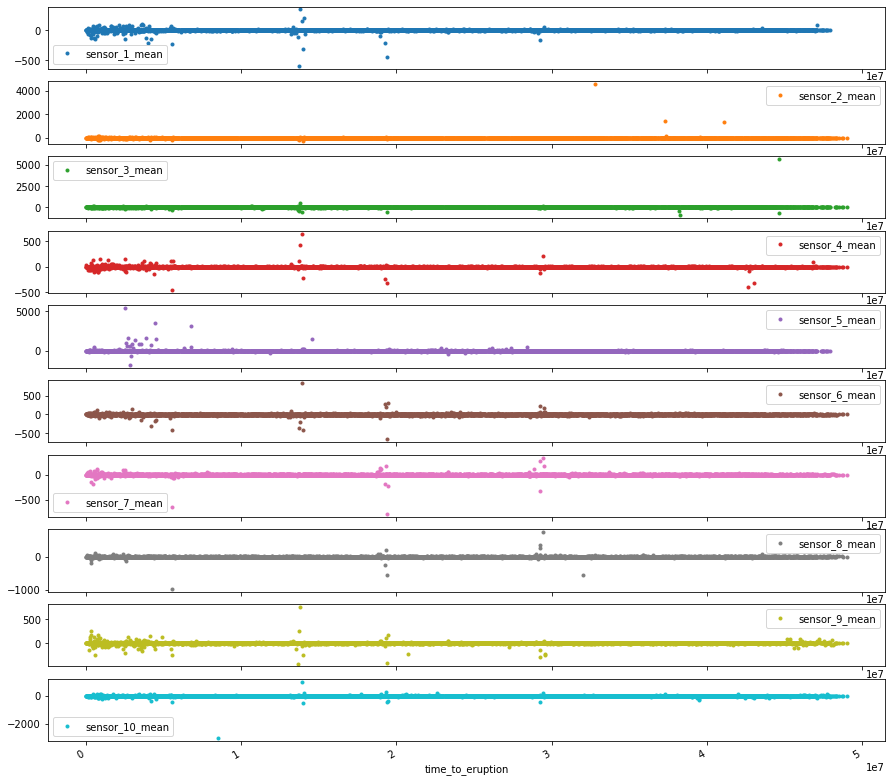

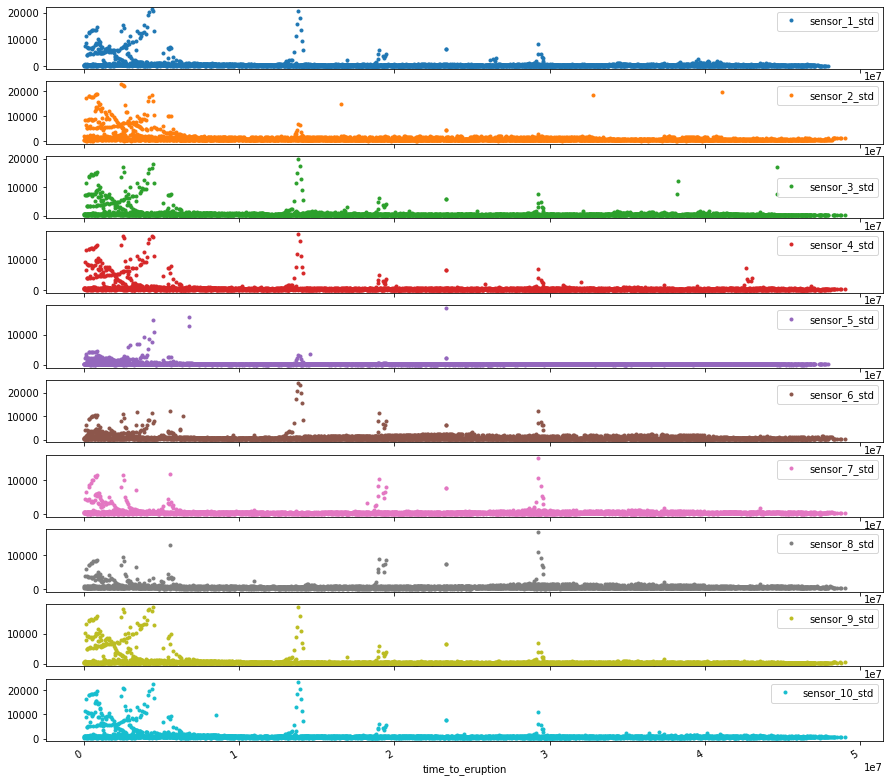

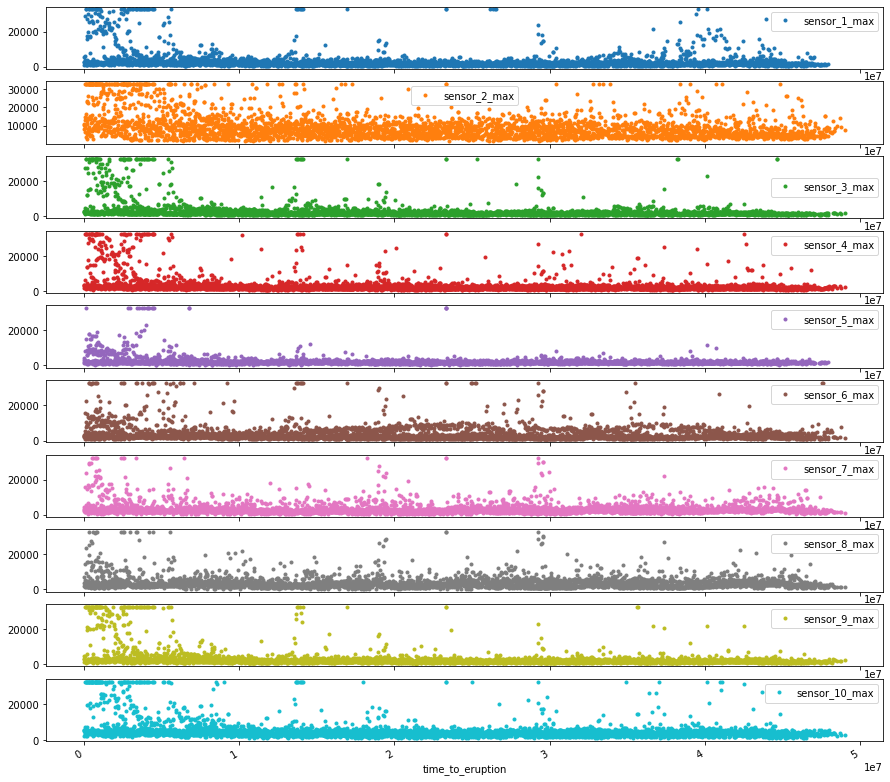

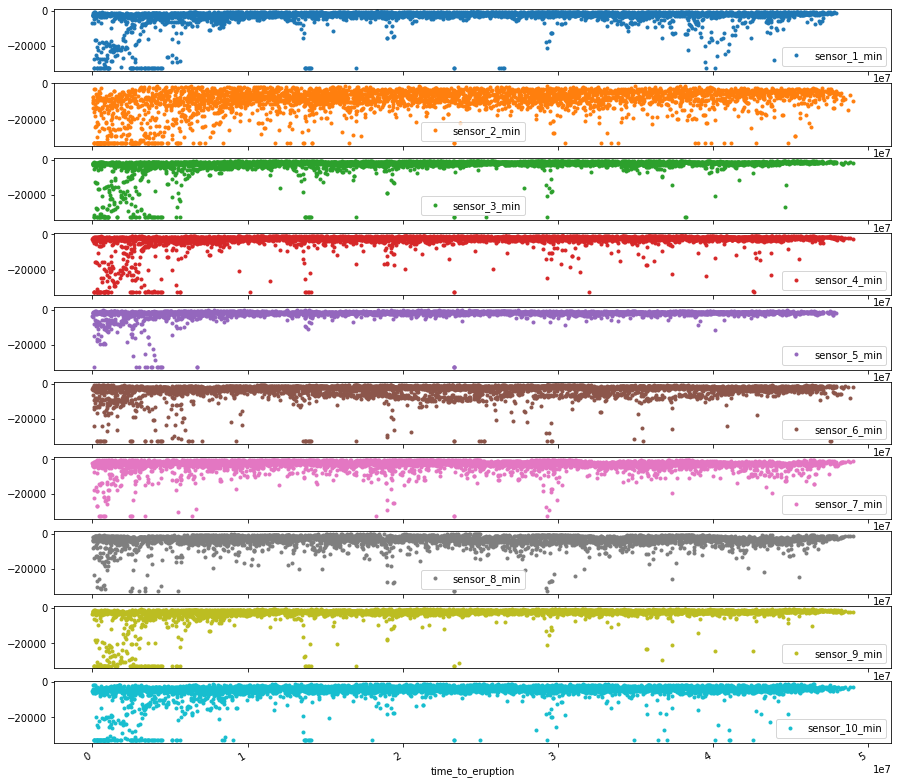

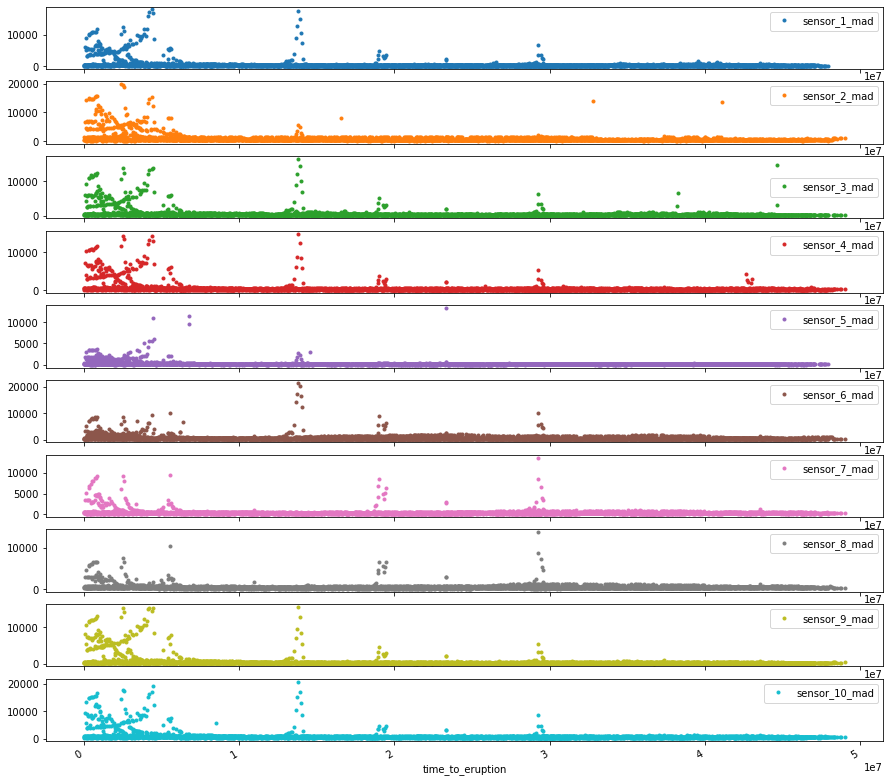

...

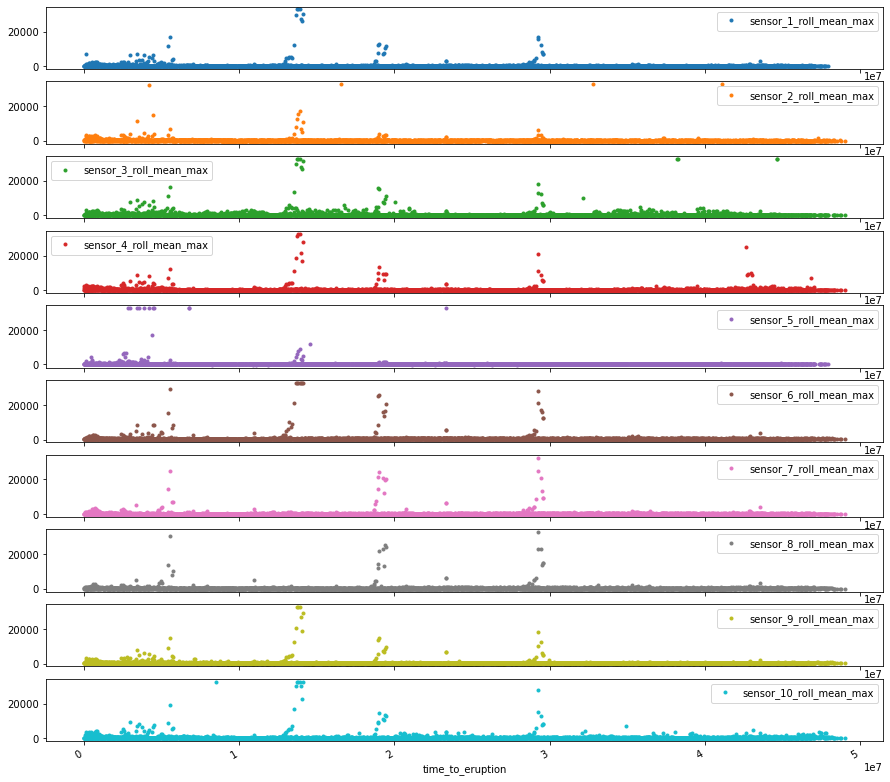

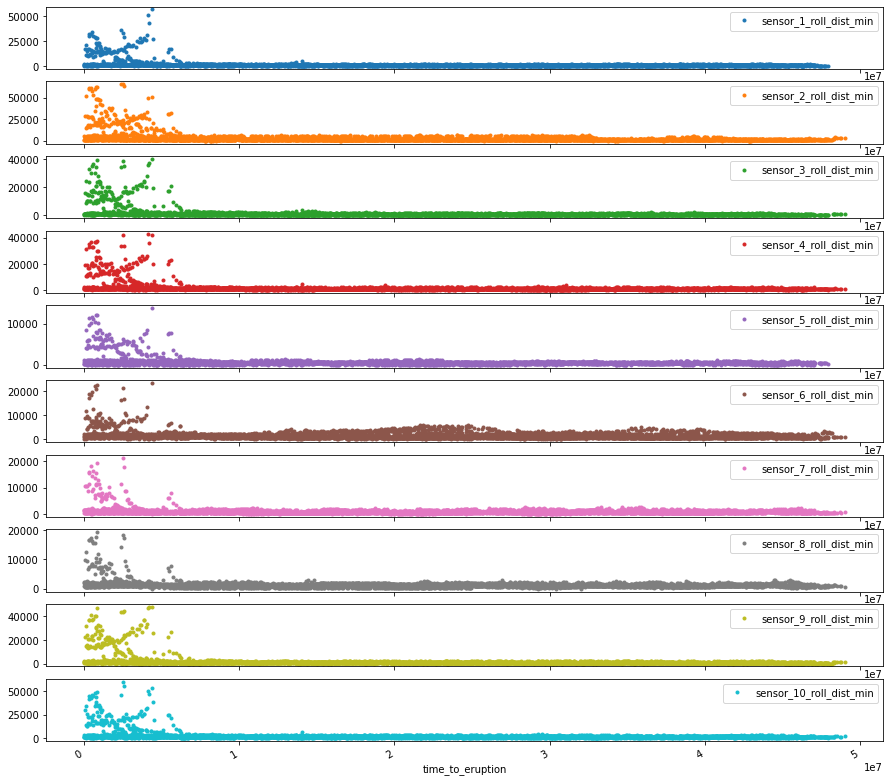

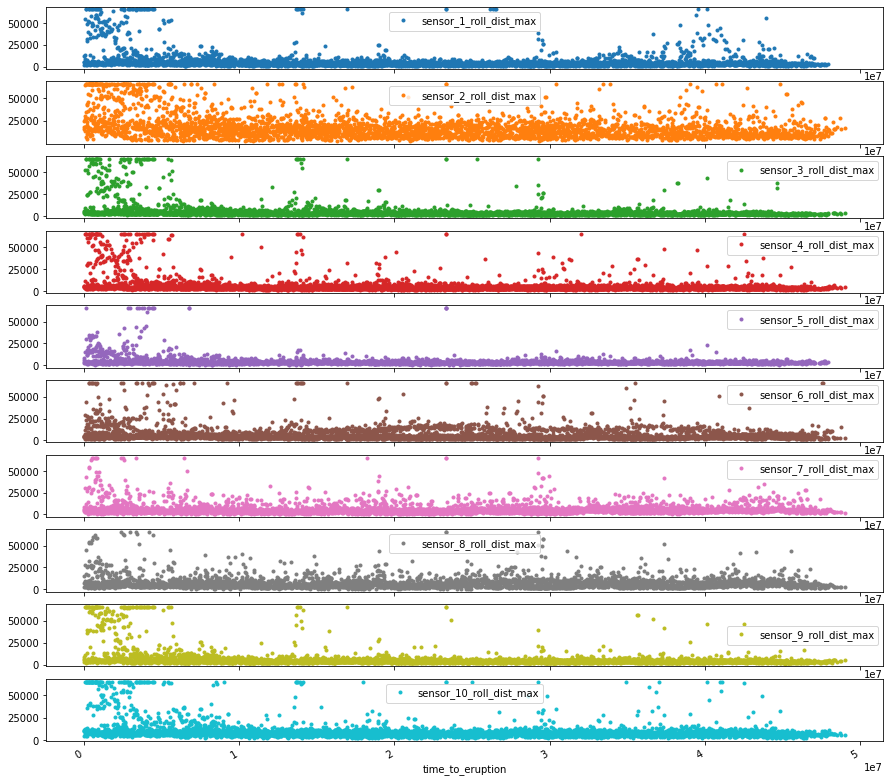

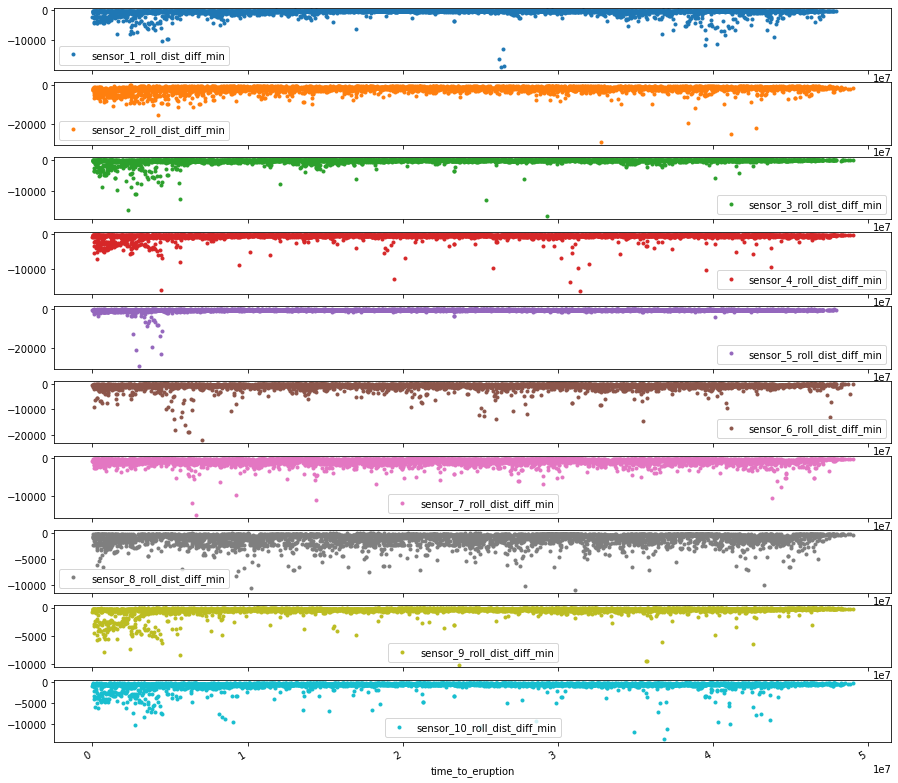

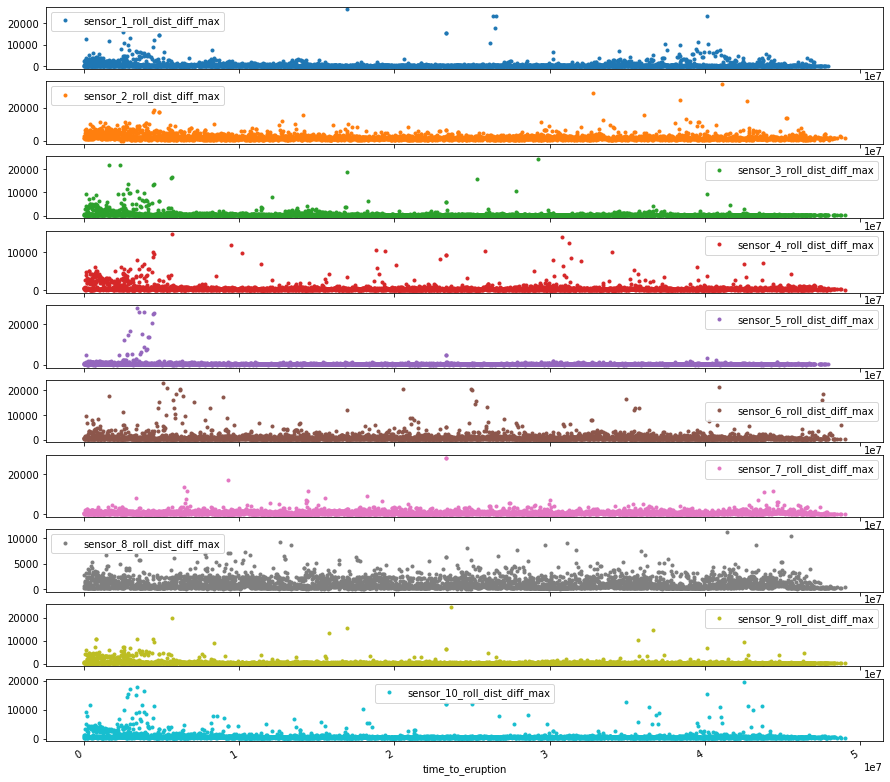

In [16]:
# Check Features

for _fs in fs:
    data.plot(x="time_to_eruption",
              y=[f"sensor_{i}" + _fs for i in range(1,11)],
              marker=".",linestyle="",figsize=(15,15),subplots=True)
    plt.show()

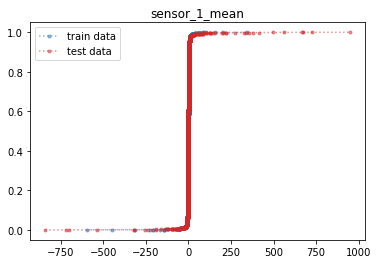

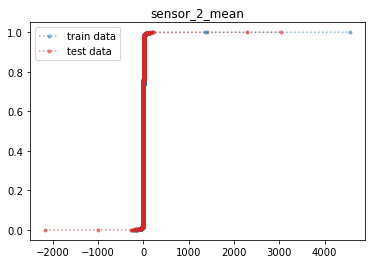

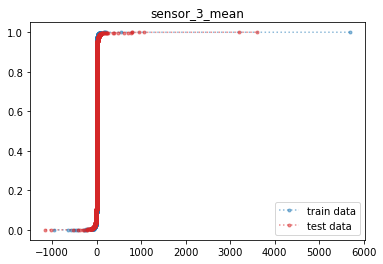

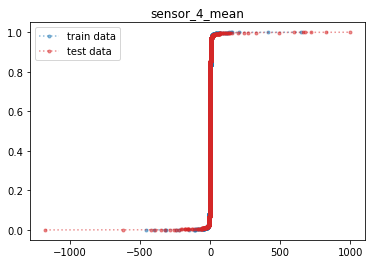

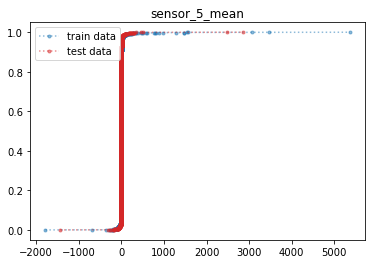

...

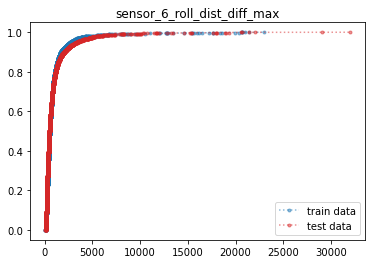

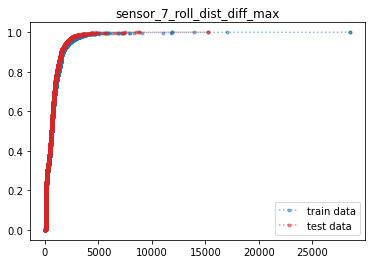

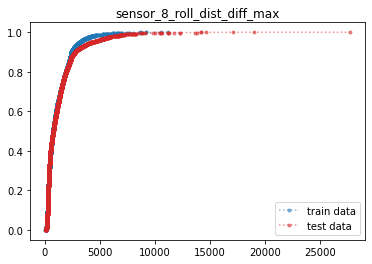

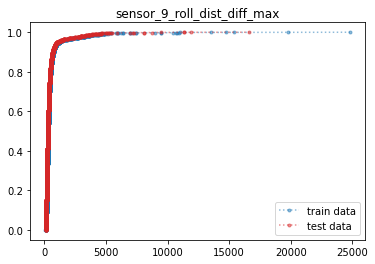

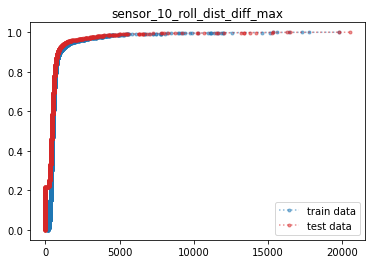

In [17]:
# Check Features


for _fs in fs:
    for i in range(1,11):
        _c = f"sensor_{i}{_fs}"
        plot_data = data[_c].sort_values()
        _nd = plot_data.notna().sum()
        plt.plot(plot_data,np.arange(1,plot_data.shape[0]+1)/_nd,
                 color="tab:blue",label="train data",marker=".",linestyle=":",alpha=0.5)

        plot_test = test[_c].sort_values()
        _nt = plot_test.notna().sum()
        plt.plot(plot_test,np.arange(1,plot_test.shape[0]+1)/_nt,
                 color="tab:red" ,label="test data" ,marker=".",linestyle=":",alpha=0.5)

        plt.title(_c)
        plt.legend()
        plt.show()

# Train

[I 2020-11-11 06:58:02,495] A new study created in memory with name: no-name-267b18c2-9a3d-46e4-9dc6-18757f85e883
feature_fraction, val_score: inf:   0%|          | 0/7 [00:00<?, ?it/s]

[1]	train's l1: 0.802959	test's l1: 0.825926
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.751694	test's l1: 0.77279
[3]	train's l1: 0.708396	test's l1: 0.734833
[4]	train's l1: 0.663818	test's l1: 0.689163
[5]	train's l1: 0.625781	test's l1: 0.654441
[6]	train's l1: 0.592604	test's l1: 0.621762
[7]	train's l1: 0.561831	test's l1: 0.594178
[8]	train's l1: 0.530115	test's l1: 0.564514
[9]	train's l1: 0.500444	test's l1: 0.534607
[10]	train's l1: 0.475837	test's l1: 0.510574
[11]	train's l1: 0.452671	test's l1: 0.489891
[12]	train's l1: 0.430037	test's l1: 0.469439
[13]	train's l1: 0.411932	test's l1: 0.451799
[14]	train's l1: 0.393594	test's l1: 0.432108
[15]	train's l1: 0.376813	test's l1: 0.415398
[16]	train's l1: 0.362846	test's l1: 0.401737
[17]	train's l1: 0.347475	test's l1: 0.386501
[18]	train's l1: 0.334569	test's l1: 0.375574
[19]	train's l1: 0.322996	test's l1: 0.363853
[20]	train's l1: 0.311709	test's l1: 0.354336
[21]	train's l1: 0.300583	tes

feature_fraction, val_score: 0.211517:  14%|#4        | 1/7 [00:17<01:45, 17.51s/it]

[1]	train's l1: 0.803048	test's l1: 0.827873
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.749968	test's l1: 0.774719
[3]	train's l1: 0.706313	test's l1: 0.736592
[4]	train's l1: 0.668007	test's l1: 0.699519
[5]	train's l1: 0.631879	test's l1: 0.661266
[6]	train's l1: 0.595285	test's l1: 0.623254
[7]	train's l1: 0.561993	test's l1: 0.588407
[8]	train's l1: 0.531743	test's l1: 0.558285
[9]	train's l1: 0.504895	test's l1: 0.532213
[10]	train's l1: 0.478081	test's l1: 0.505779
[11]	train's l1: 0.45527	test's l1: 0.482271
[12]	train's l1: 0.432802	test's l1: 0.461006
[13]	train's l1: 0.412403	test's l1: 0.439274
[14]	train's l1: 0.394408	test's l1: 0.420254
[15]	train's l1: 0.378118	test's l1: 0.405269
[16]	train's l1: 0.362958	test's l1: 0.389771
[17]	train's l1: 0.349146	test's l1: 0.375704
[18]	train's l1: 0.33622	test's l1: 0.365029
[19]	train's l1: 0.324383	test's l1: 0.354232
[20]	train's l1: 0.313841	test's l1: 0.343933
[21]	train's l1: 0.303562	test

feature_fraction, val_score: 0.202167:  29%|##8       | 2/7 [00:28<01:18, 15.66s/it]

[265]	train's l1: 0.0357119	test's l1: 0.20249
[266]	train's l1: 0.0354863	test's l1: 0.202395
[267]	train's l1: 0.0352489	test's l1: 0.202333
Early stopping, best iteration is:
[237]	train's l1: 0.042371	test's l1: 0.202167
[1]	train's l1: 0.812531	test's l1: 0.841352
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.75673	test's l1: 0.785361
[3]	train's l1: 0.713558	test's l1: 0.741923
[4]	train's l1: 0.669513	test's l1: 0.695877
[5]	train's l1: 0.633039	test's l1: 0.65838
[6]	train's l1: 0.600309	test's l1: 0.623536
[7]	train's l1: 0.56879	test's l1: 0.591446
[8]	train's l1: 0.533262	test's l1: 0.558954
[9]	train's l1: 0.50456	test's l1: 0.534506
[10]	train's l1: 0.480475	test's l1: 0.511411
[11]	train's l1: 0.457442	test's l1: 0.48799
[12]	train's l1: 0.435946	test's l1: 0.466785
[13]	train's l1: 0.417251	test's l1: 0.451164
[14]	train's l1: 0.399354	test's l1: 0.434139
[15]	train's l1: 0.383812	test's l1: 0.41846
[16]	train's l1: 0.369645	test's l1: 0.

feature_fraction, val_score: 0.202167:  43%|####2     | 3/7 [00:40<00:58, 14.57s/it]

[382]	train's l1: 0.019375	test's l1: 0.218017
[383]	train's l1: 0.0192848	test's l1: 0.218032
[384]	train's l1: 0.0191808	test's l1: 0.218004
[385]	train's l1: 0.0190644	test's l1: 0.217962
Early stopping, best iteration is:
[355]	train's l1: 0.0224669	test's l1: 0.217935
[1]	train's l1: 0.812619	test's l1: 0.836251
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.766609	test's l1: 0.793441
[3]	train's l1: 0.72309	test's l1: 0.749653
[4]	train's l1: 0.677141	test's l1: 0.701122
[5]	train's l1: 0.641	test's l1: 0.661854
[6]	train's l1: 0.607971	test's l1: 0.628683
[7]	train's l1: 0.575271	test's l1: 0.595915
[8]	train's l1: 0.540364	test's l1: 0.562701
[9]	train's l1: 0.512761	test's l1: 0.536705
[10]	train's l1: 0.487876	test's l1: 0.51065
[11]	train's l1: 0.465579	test's l1: 0.488368
[12]	train's l1: 0.443068	test's l1: 0.468019
[13]	train's l1: 0.424271	test's l1: 0.447401
[14]	train's l1: 0.407099	test's l1: 0.433209
[15]	train's l1: 0.392108	test's l1

feature_fraction, val_score: 0.200184:  57%|#####7    | 4/7 [00:48<00:37, 12.45s/it]

[240]	train's l1: 0.0457177	test's l1: 0.200865
[241]	train's l1: 0.0453944	test's l1: 0.200892
[242]	train's l1: 0.0450963	test's l1: 0.20088
[243]	train's l1: 0.0448597	test's l1: 0.200773
Early stopping, best iteration is:
[213]	train's l1: 0.0535356	test's l1: 0.200184
[1]	train's l1: 0.802819	test's l1: 0.827118
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.749742	test's l1: 0.774118
[3]	train's l1: 0.706655	test's l1: 0.734704
[4]	train's l1: 0.664378	test's l1: 0.690135
[5]	train's l1: 0.627967	test's l1: 0.656318
[6]	train's l1: 0.588774	test's l1: 0.619759
[7]	train's l1: 0.555967	test's l1: 0.590231
[8]	train's l1: 0.525864	test's l1: 0.5613
[9]	train's l1: 0.499962	test's l1: 0.534925
[10]	train's l1: 0.476014	test's l1: 0.510827
[11]	train's l1: 0.454743	test's l1: 0.491908
[12]	train's l1: 0.432872	test's l1: 0.469438
[13]	train's l1: 0.413628	test's l1: 0.450141
[14]	train's l1: 0.395467	test's l1: 0.430821
[15]	train's l1: 0.37978	test's 

feature_fraction, val_score: 0.200184:  71%|#######1  | 5/7 [00:54<00:21, 10.65s/it]

[178]	train's l1: 0.0641304	test's l1: 0.216123
[179]	train's l1: 0.0636564	test's l1: 0.215954
Early stopping, best iteration is:
[149]	train's l1: 0.0772506	test's l1: 0.215042
[1]	train's l1: 0.804171	test's l1: 0.831234
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.751355	test's l1: 0.777702
[3]	train's l1: 0.703486	test's l1: 0.727628
[4]	train's l1: 0.661807	test's l1: 0.687126
[5]	train's l1: 0.625965	test's l1: 0.652318
[6]	train's l1: 0.59145	test's l1: 0.617863
[7]	train's l1: 0.557756	test's l1: 0.581229
[8]	train's l1: 0.530354	test's l1: 0.5516
[9]	train's l1: 0.503987	test's l1: 0.526199
[10]	train's l1: 0.479053	test's l1: 0.501597
[11]	train's l1: 0.456912	test's l1: 0.481315
[12]	train's l1: 0.436351	test's l1: 0.462014
[13]	train's l1: 0.417286	test's l1: 0.445061
[14]	train's l1: 0.399987	test's l1: 0.429182
[15]	train's l1: 0.383754	test's l1: 0.413411
[16]	train's l1: 0.369664	test's l1: 0.400416
[17]	train's l1: 0.356111	test's l1:

feature_fraction, val_score: 0.200184:  86%|########5 | 6/7 [01:10<00:12, 12.19s/it]

[295]	train's l1: 0.0284597	test's l1: 0.215137
Early stopping, best iteration is:
[265]	train's l1: 0.0344698	test's l1: 0.214901
[1]	train's l1: 0.804213	test's l1: 0.830673
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.750351	test's l1: 0.774522
[3]	train's l1: 0.707228	test's l1: 0.73536
[4]	train's l1: 0.662844	test's l1: 0.688475
[5]	train's l1: 0.624651	test's l1: 0.653612
[6]	train's l1: 0.592251	test's l1: 0.622799
[7]	train's l1: 0.560058	test's l1: 0.591419
[8]	train's l1: 0.530961	test's l1: 0.560105
[9]	train's l1: 0.503882	test's l1: 0.531415
[10]	train's l1: 0.478858	test's l1: 0.50725
[11]	train's l1: 0.454885	test's l1: 0.483495
[12]	train's l1: 0.432971	test's l1: 0.460892
[13]	train's l1: 0.412381	test's l1: 0.44023
[14]	train's l1: 0.396469	test's l1: 0.425417
[15]	train's l1: 0.379752	test's l1: 0.412672
[16]	train's l1: 0.364159	test's l1: 0.397549
[17]	train's l1: 0.347192	test's l1: 0.380956
[18]	train's l1: 0.334546	test's l1: 0

num_leaves, val_score: 0.200184:   0%|          | 0/20 [00:00<?, ?it/s]

[180]	train's l1: 0.0596679	test's l1: 0.209136
[181]	train's l1: 0.059259	test's l1: 0.208987
Early stopping, best iteration is:
[151]	train's l1: 0.0731126	test's l1: 0.208624
[1]	train's l1: 0.81894	test's l1: 0.842377
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.776451	test's l1: 0.79909
[3]	train's l1: 0.737444	test's l1: 0.758143
[4]	train's l1: 0.696041	test's l1: 0.714773
[5]	train's l1: 0.667359	test's l1: 0.682994
[6]	train's l1: 0.638311	test's l1: 0.649961
[7]	train's l1: 0.601379	test's l1: 0.614187
[8]	train's l1: 0.568972	test's l1: 0.585081
[9]	train's l1: 0.543991	test's l1: 0.561781
[10]	train's l1: 0.522713	test's l1: 0.539831
[11]	train's l1: 0.503396	test's l1: 0.518854
[12]	train's l1: 0.481111	test's l1: 0.4984
[13]	train's l1: 0.462414	test's l1: 0.483118
[14]	train's l1: 0.446565	test's l1: 0.469854
[15]	train's l1: 0.431231	test's l1: 0.453042
[16]	train's l1: 0.418006	test's l1: 0.441615
[17]	train's l1: 0.407063	test's l1: 0

num_leaves, val_score: 0.200184:   5%|5         | 1/20 [00:04<01:34,  4.98s/it]

[242]	train's l1: 0.0755043	test's l1: 0.213448
Early stopping, best iteration is:
[212]	train's l1: 0.0861249	test's l1: 0.213191
[1]	train's l1: 0.795389	test's l1: 0.827492
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.734611	test's l1: 0.770094
[3]	train's l1: 0.678697	test's l1: 0.717709
[4]	train's l1: 0.624304	test's l1: 0.666361
[5]	train's l1: 0.576847	test's l1: 0.619929
[6]	train's l1: 0.532819	test's l1: 0.575234
[7]	train's l1: 0.493157	test's l1: 0.539245
[8]	train's l1: 0.455289	test's l1: 0.503472
[9]	train's l1: 0.421213	test's l1: 0.474393
[10]	train's l1: 0.391683	test's l1: 0.444289
[11]	train's l1: 0.364794	test's l1: 0.41991
[12]	train's l1: 0.338891	test's l1: 0.398013
[13]	train's l1: 0.315762	test's l1: 0.376982
[14]	train's l1: 0.294532	test's l1: 0.355123
[15]	train's l1: 0.276184	test's l1: 0.338725
[16]	train's l1: 0.259128	test's l1: 0.325526
[17]	train's l1: 0.243924	test's l1: 0.312919
[18]	train's l1: 0.228326	test's l1:

num_leaves, val_score: 0.192904:  10%|#         | 2/20 [00:15<02:01,  6.74s/it]

[157]	train's l1: 0.00927937	test's l1: 0.193253
[158]	train's l1: 0.00914529	test's l1: 0.193277
Early stopping, best iteration is:
[128]	train's l1: 0.0151268	test's l1: 0.192904
[1]	train's l1: 0.800016	test's l1: 0.831117
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.741276	test's l1: 0.776717
[3]	train's l1: 0.688047	test's l1: 0.724029
[4]	train's l1: 0.63614	test's l1: 0.67461
[5]	train's l1: 0.591607	test's l1: 0.628249
[6]	train's l1: 0.550826	test's l1: 0.584176
[7]	train's l1: 0.511657	test's l1: 0.548564
[8]	train's l1: 0.475866	test's l1: 0.514321
[9]	train's l1: 0.442324	test's l1: 0.480394
[10]	train's l1: 0.413439	test's l1: 0.451596
[11]	train's l1: 0.387205	test's l1: 0.427708
[12]	train's l1: 0.36231	test's l1: 0.403176
[13]	train's l1: 0.340307	test's l1: 0.38273
[14]	train's l1: 0.321267	test's l1: 0.365758
[15]	train's l1: 0.304942	test's l1: 0.351544
[16]	train's l1: 0.288197	test's l1: 0.33894
[17]	train's l1: 0.273347	test's l1:

num_leaves, val_score: 0.192904:  15%|#5        | 3/20 [00:33<02:48,  9.91s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  20%|##        | 4/20 [00:49<03:09, 11.87s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  25%|##5       | 5/20 [01:05<03:16, 13.13s/it]

[171]	train's l1: 0.00324147	test's l1: 0.183973
Early stopping, best iteration is:
[141]	train's l1: 0.00518459	test's l1: 0.18379
[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 

num_leaves, val_score: 0.183790:  30%|###       | 6/20 [01:22<03:19, 14.27s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  35%|###5      | 7/20 [01:38<03:11, 14.74s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  40%|####      | 8/20 [01:55<03:04, 15.40s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  45%|####5     | 9/20 [02:11<02:52, 15.72s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  50%|#####     | 10/20 [02:29<02:42, 16.22s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  55%|#####5    | 11/20 [02:44<02:23, 15.90s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  60%|######    | 12/20 [03:00<02:08, 16.08s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  65%|######5   | 13/20 [03:15<01:50, 15.77s/it]

[1]	train's l1: 0.794146	test's l1: 0.825814
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.731727	test's l1: 0.770411
[3]	train's l1: 0.674312	test's l1: 0.713373
[4]	train's l1: 0.61878	test's l1: 0.658822
[5]	train's l1: 0.570301	test's l1: 0.610204
[6]	train's l1: 0.526491	test's l1: 0.565674
[7]	train's l1: 0.485107	test's l1: 0.528479
[8]	train's l1: 0.445706	test's l1: 0.491638
[9]	train's l1: 0.410884	test's l1: 0.459519
[10]	train's l1: 0.380398	test's l1: 0.430614
[11]	train's l1: 0.353244	test's l1: 0.406728
[12]	train's l1: 0.326938	test's l1: 0.383656
[13]	train's l1: 0.3037	test's l1: 0.36273
[14]	train's l1: 0.283014	test's l1: 0.345229
[15]	train's l1: 0.264274	test's l1: 0.329231
[16]	train's l1: 0.24661	test's l1: 0.315145
[17]	train's l1: 0.230268	test's l1: 0.304285
[18]	train's l1: 0.214333	test's l1: 0.293012
[19]	train's l1: 0.201461	test's l1: 0.2826
[20]	train's l1: 0.189559	test's l1: 0.273681
[21]	train's l1: 0.177486	test's l1

num_leaves, val_score: 0.183790:  70%|#######   | 14/20 [03:40<01:50, 18.44s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  75%|#######5  | 15/20 [03:57<01:29, 17.89s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  80%|########  | 16/20 [04:12<01:08, 17.03s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  85%|########5 | 17/20 [04:30<00:52, 17.37s/it]

[171]	train's l1: 0.00324147	test's l1: 0.183973
Early stopping, best iteration is:
[141]	train's l1: 0.00518459	test's l1: 0.18379
[1]	train's l1: 0.793791	test's l1: 0.825734
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730991	test's l1: 0.769847
[3]	train's l1: 0.673328	test's l1: 0.713181
[4]	train's l1: 0.617609	test's l1: 0.660184
[5]	train's l1: 0.568579	test's l1: 0.613237
[6]	train's l1: 0.524535	test's l1: 0.570334
[7]	train's l1: 0.483155	test's l1: 0.533654
[8]	train's l1: 0.443638	test's l1: 0.495995
[9]	train's l1: 0.409221	test's l1: 0.464013
[10]	train's l1: 0.378353	test's l1: 0.433743
[11]	train's l1: 0.350394	test's l1: 0.40669
[12]	train's l1: 0.324924	test's l1: 0.385365
[13]	train's l1: 0.301325	test's l1: 0.36343
[14]	train's l1: 0.279494	test's l1: 0.342977
[15]	train's l1: 0.260039	test's l1: 0.328214
[16]	train's l1: 0.24235	test's l1: 0.314427
[17]	train's l1: 0.22608	test's l1: 0.301432
[18]	train's l1: 0.210461	test's l1: 0

num_leaves, val_score: 0.183790:  90%|######### | 18/20 [04:48<00:35, 17.59s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

num_leaves, val_score: 0.183790:  95%|#########5| 19/20 [05:05<00:17, 17.39s/it]

[1]	train's l1: 0.793603	test's l1: 0.825507
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730567	test's l1: 0.76996
[3]	train's l1: 0.672913	test's l1: 0.713956
[4]	train's l1: 0.617236	test's l1: 0.660942
[5]	train's l1: 0.568214	test's l1: 0.613269
[6]	train's l1: 0.524314	test's l1: 0.570351
[7]	train's l1: 0.483894	test's l1: 0.533417
[8]	train's l1: 0.444487	test's l1: 0.496064
[9]	train's l1: 0.409412	test's l1: 0.464979
[10]	train's l1: 0.378317	test's l1: 0.435181
[11]	train's l1: 0.350443	test's l1: 0.411289
[12]	train's l1: 0.323295	test's l1: 0.386152
[13]	train's l1: 0.299922	test's l1: 0.364285
[14]	train's l1: 0.278113	test's l1: 0.344148
[15]	train's l1: 0.258958	test's l1: 0.329176
[16]	train's l1: 0.241023	test's l1: 0.31416
[17]	train's l1: 0.224266	test's l1: 0.30125
[18]	train's l1: 0.207944	test's l1: 0.288305
[19]	train's l1: 0.194672	test's l1: 0.277003
[20]	train's l1: 0.182042	test's l1: 0.267918
[21]	train's l1: 0.16925	test's

bagging, val_score: 0.183790:   0%|          | 0/10 [00:00<?, ?it/s]

[1]	train's l1: 0.799948	test's l1: 0.832036
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.743542	test's l1: 0.776863
[3]	train's l1: 0.691636	test's l1: 0.729514
[4]	train's l1: 0.639813	test's l1: 0.679911
[5]	train's l1: 0.594544	test's l1: 0.634669
[6]	train's l1: 0.555651	test's l1: 0.592994
[7]	train's l1: 0.517032	test's l1: 0.556484
[8]	train's l1: 0.480684	test's l1: 0.523173
[9]	train's l1: 0.44703	test's l1: 0.492294
[10]	train's l1: 0.416908	test's l1: 0.463402
[11]	train's l1: 0.390515	test's l1: 0.438836
[12]	train's l1: 0.365443	test's l1: 0.417067
[13]	train's l1: 0.342618	test's l1: 0.39709
[14]	train's l1: 0.322357	test's l1: 0.379148
[15]	train's l1: 0.304239	test's l1: 0.363039
[16]	train's l1: 0.285937	test's l1: 0.347887
[17]	train's l1: 0.270966	test's l1: 0.335513
[18]	train's l1: 0.25484	test's l1: 0.323545
[19]	train's l1: 0.240764	test's l1: 0.313561
[20]	train's l1: 0.228345	test's l1: 0.303948
[21]	train's l1: 0.215434	test'

bagging, val_score: 0.183790:  10%|#         | 1/10 [00:19<02:52, 19.19s/it]

[266]	train's l1: 0.00439751	test's l1: 0.1995
Early stopping, best iteration is:
[236]	train's l1: 0.00563068	test's l1: 0.199289
[1]	train's l1: 0.79447	test's l1: 0.825708
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730961	test's l1: 0.765441
[3]	train's l1: 0.674695	test's l1: 0.71565
[4]	train's l1: 0.620461	test's l1: 0.665934
[5]	train's l1: 0.572963	test's l1: 0.622058
[6]	train's l1: 0.530206	test's l1: 0.582011
[7]	train's l1: 0.487962	test's l1: 0.540901
[8]	train's l1: 0.450724	test's l1: 0.505695
[9]	train's l1: 0.414201	test's l1: 0.472335
[10]	train's l1: 0.382688	test's l1: 0.443304
[11]	train's l1: 0.355264	test's l1: 0.420082
[12]	train's l1: 0.328461	test's l1: 0.398209
[13]	train's l1: 0.30483	test's l1: 0.379535
[14]	train's l1: 0.283182	test's l1: 0.363094
[15]	train's l1: 0.26375	test's l1: 0.348242
[16]	train's l1: 0.246653	test's l1: 0.333756
[17]	train's l1: 0.230411	test's l1: 0.321687
[18]	train's l1: 0.213951	test's l1: 0.

bagging, val_score: 0.183790:  20%|##        | 2/10 [00:33<02:21, 17.71s/it]

[1]	train's l1: 0.808288	test's l1: 0.836657
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.754625	test's l1: 0.785026
[3]	train's l1: 0.710419	test's l1: 0.7378
[4]	train's l1: 0.663415	test's l1: 0.694387
[5]	train's l1: 0.625566	test's l1: 0.65044
[6]	train's l1: 0.593276	test's l1: 0.616864
[7]	train's l1: 0.555314	test's l1: 0.578467
[8]	train's l1: 0.520289	test's l1: 0.542743
[9]	train's l1: 0.489488	test's l1: 0.516065
[10]	train's l1: 0.462927	test's l1: 0.488435
[11]	train's l1: 0.438101	test's l1: 0.46409
[12]	train's l1: 0.415007	test's l1: 0.441549
[13]	train's l1: 0.394917	test's l1: 0.421591
[14]	train's l1: 0.374865	test's l1: 0.406463
[15]	train's l1: 0.356324	test's l1: 0.38773
[16]	train's l1: 0.33988	test's l1: 0.372646
[17]	train's l1: 0.325452	test's l1: 0.358595
[18]	train's l1: 0.310502	test's l1: 0.347859
[19]	train's l1: 0.298669	test's l1: 0.339421
[20]	train's l1: 0.287006	test's l1: 0.332458
[21]	train's l1: 0.274296	test's l

bagging, val_score: 0.183790:  30%|###       | 3/10 [00:39<01:40, 14.32s/it]

[165]	train's l1: 0.0438095	test's l1: 0.213824
[166]	train's l1: 0.0435001	test's l1: 0.21373
[167]	train's l1: 0.0431061	test's l1: 0.21407
[168]	train's l1: 0.0426188	test's l1: 0.213896
Early stopping, best iteration is:
[138]	train's l1: 0.0558469	test's l1: 0.213345
[1]	train's l1: 0.794399	test's l1: 0.825535
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.731177	test's l1: 0.765511
[3]	train's l1: 0.67337	test's l1: 0.710653
[4]	train's l1: 0.618044	test's l1: 0.657763
[5]	train's l1: 0.56957	test's l1: 0.614874
[6]	train's l1: 0.527101	test's l1: 0.5755
[7]	train's l1: 0.485102	test's l1: 0.536795
[8]	train's l1: 0.447792	test's l1: 0.501708
[9]	train's l1: 0.41297	test's l1: 0.468115
[10]	train's l1: 0.382187	test's l1: 0.439556
[11]	train's l1: 0.353722	test's l1: 0.414937
[12]	train's l1: 0.327944	test's l1: 0.394191
[13]	train's l1: 0.304537	test's l1: 0.374769
[14]	train's l1: 0.283347	test's l1: 0.35779
[15]	train's l1: 0.263171	test's l1: 

bagging, val_score: 0.183790:  40%|####      | 4/10 [01:04<01:44, 17.35s/it]

[1]	train's l1: 0.808821	test's l1: 0.839003
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.75911	test's l1: 0.791626
[3]	train's l1: 0.71288	test's l1: 0.747887
[4]	train's l1: 0.669272	test's l1: 0.709352
[5]	train's l1: 0.629028	test's l1: 0.666234
[6]	train's l1: 0.588921	test's l1: 0.627832
[7]	train's l1: 0.556603	test's l1: 0.597014
[8]	train's l1: 0.525232	test's l1: 0.563289
[9]	train's l1: 0.494514	test's l1: 0.535116
[10]	train's l1: 0.467425	test's l1: 0.50629
[11]	train's l1: 0.442655	test's l1: 0.481109
[12]	train's l1: 0.418884	test's l1: 0.454873
[13]	train's l1: 0.39879	test's l1: 0.436296
[14]	train's l1: 0.380726	test's l1: 0.41735
[15]	train's l1: 0.365736	test's l1: 0.401352
[16]	train's l1: 0.350736	test's l1: 0.386434
[17]	train's l1: 0.334798	test's l1: 0.371477
[18]	train's l1: 0.319505	test's l1: 0.357676
[19]	train's l1: 0.307118	test's l1: 0.348433
[20]	train's l1: 0.296984	test's l1: 0.338783
[21]	train's l1: 0.283799	test's 

bagging, val_score: 0.183790:  50%|#####     | 5/10 [01:09<01:08, 13.73s/it]

[138]	train's l1: 0.0629041	test's l1: 0.227369
[139]	train's l1: 0.062376	test's l1: 0.227729
[140]	train's l1: 0.0618376	test's l1: 0.228044
Early stopping, best iteration is:
[110]	train's l1: 0.081511	test's l1: 0.226678
[1]	train's l1: 0.80123	test's l1: 0.833598
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.745928	test's l1: 0.778775
[3]	train's l1: 0.694064	test's l1: 0.730165
[4]	train's l1: 0.641045	test's l1: 0.680309
[5]	train's l1: 0.596333	test's l1: 0.634387
[6]	train's l1: 0.555501	test's l1: 0.595009
[7]	train's l1: 0.516291	test's l1: 0.558234
[8]	train's l1: 0.480598	test's l1: 0.524226
[9]	train's l1: 0.446571	test's l1: 0.495242
[10]	train's l1: 0.418718	test's l1: 0.467356
[11]	train's l1: 0.391451	test's l1: 0.444042
[12]	train's l1: 0.364688	test's l1: 0.42088
[13]	train's l1: 0.340397	test's l1: 0.397659
[14]	train's l1: 0.319461	test's l1: 0.378459
[15]	train's l1: 0.300969	test's l1: 0.358856
[16]	train's l1: 0.283937	test's l1

bagging, val_score: 0.183790:  60%|######    | 6/10 [01:24<00:56, 14.20s/it]

[222]	train's l1: 0.00801313	test's l1: 0.200403
Early stopping, best iteration is:
[192]	train's l1: 0.0109825	test's l1: 0.200029
[1]	train's l1: 0.796998	test's l1: 0.827693
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.737099	test's l1: 0.773605
[3]	train's l1: 0.682031	test's l1: 0.720669
[4]	train's l1: 0.62727	test's l1: 0.668401
[5]	train's l1: 0.580549	test's l1: 0.620911
[6]	train's l1: 0.537224	test's l1: 0.578485
[7]	train's l1: 0.496913	test's l1: 0.540725
[8]	train's l1: 0.460079	test's l1: 0.504461
[9]	train's l1: 0.426415	test's l1: 0.475126
[10]	train's l1: 0.395866	test's l1: 0.44826
[11]	train's l1: 0.370152	test's l1: 0.427274
[12]	train's l1: 0.342816	test's l1: 0.403638
[13]	train's l1: 0.319182	test's l1: 0.383372
[14]	train's l1: 0.297541	test's l1: 0.366076
[15]	train's l1: 0.27833	test's l1: 0.350548
[16]	train's l1: 0.260706	test's l1: 0.337002
[17]	train's l1: 0.24387	test's l1: 0.323993
[18]	train's l1: 0.227809	test's l1: 0

bagging, val_score: 0.183790:  70%|#######   | 7/10 [01:39<00:43, 14.42s/it]

[1]	train's l1: 0.803251	test's l1: 0.831356
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.747618	test's l1: 0.773527
[3]	train's l1: 0.697273	test's l1: 0.721172
[4]	train's l1: 0.650632	test's l1: 0.673455
[5]	train's l1: 0.608137	test's l1: 0.628656
[6]	train's l1: 0.571045	test's l1: 0.588582
[7]	train's l1: 0.534549	test's l1: 0.552916
[8]	train's l1: 0.497858	test's l1: 0.517375
[9]	train's l1: 0.464558	test's l1: 0.484132
[10]	train's l1: 0.435688	test's l1: 0.457621
[11]	train's l1: 0.410089	test's l1: 0.433627
[12]	train's l1: 0.384995	test's l1: 0.412457
[13]	train's l1: 0.364107	test's l1: 0.391997
[14]	train's l1: 0.344976	test's l1: 0.376202
[15]	train's l1: 0.327742	test's l1: 0.363705
[16]	train's l1: 0.311109	test's l1: 0.353237
[17]	train's l1: 0.295561	test's l1: 0.341966
[18]	train's l1: 0.280321	test's l1: 0.331163
[19]	train's l1: 0.268192	test's l1: 0.323545
[20]	train's l1: 0.256767	test's l1: 0.313485
[21]	train's l1: 0.243701	te

bagging, val_score: 0.183790:  80%|########  | 8/10 [01:47<00:24, 12.40s/it]

[154]	train's l1: 0.0259494	test's l1: 0.204202
Early stopping, best iteration is:
[124]	train's l1: 0.0374275	test's l1: 0.202357
[1]	train's l1: 0.797322	test's l1: 0.827822
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.736326	test's l1: 0.769999
[3]	train's l1: 0.682637	test's l1: 0.722151
[4]	train's l1: 0.628633	test's l1: 0.6708
[5]	train's l1: 0.580691	test's l1: 0.62475
[6]	train's l1: 0.539622	test's l1: 0.585272
[7]	train's l1: 0.497408	test's l1: 0.542526
[8]	train's l1: 0.46025	test's l1: 0.508736
[9]	train's l1: 0.426555	test's l1: 0.47943
[10]	train's l1: 0.39718	test's l1: 0.451819
[11]	train's l1: 0.369685	test's l1: 0.427919
[12]	train's l1: 0.343855	test's l1: 0.40622
[13]	train's l1: 0.319652	test's l1: 0.38768
[14]	train's l1: 0.297455	test's l1: 0.369721
[15]	train's l1: 0.278899	test's l1: 0.355744
[16]	train's l1: 0.261545	test's l1: 0.342493
[17]	train's l1: 0.244854	test's l1: 0.329467
[18]	train's l1: 0.228609	test's l1: 0.3160

bagging, val_score: 0.183790:  90%|######### | 9/10 [02:01<00:12, 12.94s/it]

[151]	train's l1: 0.00860679	test's l1: 0.203015
[152]	train's l1: 0.00847893	test's l1: 0.203006
Early stopping, best iteration is:
[122]	train's l1: 0.0139194	test's l1: 0.202814
[1]	train's l1: 0.802308	test's l1: 0.833563
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.748899	test's l1: 0.783415
[3]	train's l1: 0.700291	test's l1: 0.731703
[4]	train's l1: 0.64952	test's l1: 0.683823
[5]	train's l1: 0.606058	test's l1: 0.642204
[6]	train's l1: 0.565882	test's l1: 0.599874
[7]	train's l1: 0.529469	test's l1: 0.565744
[8]	train's l1: 0.492125	test's l1: 0.531959
[9]	train's l1: 0.459496	test's l1: 0.50234
[10]	train's l1: 0.431888	test's l1: 0.478393
[11]	train's l1: 0.405374	test's l1: 0.456887
[12]	train's l1: 0.382095	test's l1: 0.433075
[13]	train's l1: 0.361592	test's l1: 0.414688
[14]	train's l1: 0.343265	test's l1: 0.396976
[15]	train's l1: 0.326102	test's l1: 0.38483
[16]	train's l1: 0.30955	test's l1: 0.369826
[17]	train's l1: 0.293811	test's l1

feature_fraction_stage2, val_score: 0.183790:   0%|          | 0/3 [00:00<?, ?it/s]

[112]	train's l1: 0.0438632	test's l1: 0.211925
[113]	train's l1: 0.0433189	test's l1: 0.211905
[114]	train's l1: 0.042747	test's l1: 0.211998
Early stopping, best iteration is:
[84]	train's l1: 0.0644289	test's l1: 0.211542
[1]	train's l1: 0.794683	test's l1: 0.825638
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.73152	test's l1: 0.767832
[3]	train's l1: 0.674796	test's l1: 0.71761
[4]	train's l1: 0.618681	test's l1: 0.660606
[5]	train's l1: 0.568829	test's l1: 0.612797
[6]	train's l1: 0.525445	test's l1: 0.574754
[7]	train's l1: 0.483805	test's l1: 0.537306
[8]	train's l1: 0.444405	test's l1: 0.500846
[9]	train's l1: 0.40875	test's l1: 0.467964
[10]	train's l1: 0.377455	test's l1: 0.439663
[11]	train's l1: 0.348826	test's l1: 0.412808
[12]	train's l1: 0.322589	test's l1: 0.388531
[13]	train's l1: 0.298095	test's l1: 0.367731
[14]	train's l1: 0.27642	test's l1: 0.348834
[15]	train's l1: 0.257367	test's l1: 0.334308
[16]	train's l1: 0.239173	test's l1: 

feature_fraction_stage2, val_score: 0.183790:  33%|###3      | 1/3 [00:22<00:44, 22.50s/it]

[1]	train's l1: 0.793828	test's l1: 0.825669
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730737	test's l1: 0.769643
[3]	train's l1: 0.672231	test's l1: 0.71341
[4]	train's l1: 0.61698	test's l1: 0.661313
[5]	train's l1: 0.568784	test's l1: 0.614401
[6]	train's l1: 0.524666	test's l1: 0.571074
[7]	train's l1: 0.483217	test's l1: 0.533494
[8]	train's l1: 0.443799	test's l1: 0.495048
[9]	train's l1: 0.409031	test's l1: 0.462532
[10]	train's l1: 0.377382	test's l1: 0.430901
[11]	train's l1: 0.349102	test's l1: 0.406236
[12]	train's l1: 0.322758	test's l1: 0.381708
[13]	train's l1: 0.299349	test's l1: 0.359519
[14]	train's l1: 0.277656	test's l1: 0.340437
[15]	train's l1: 0.258597	test's l1: 0.324586
[16]	train's l1: 0.24064	test's l1: 0.310199
[17]	train's l1: 0.223958	test's l1: 0.297688
[18]	train's l1: 0.20809	test's l1: 0.285336
[19]	train's l1: 0.193062	test's l1: 0.274201
[20]	train's l1: 0.179908	test's l1: 0.264532
[21]	train's l1: 0.168254	test's

feature_fraction_stage2, val_score: 0.182880:  67%|######6   | 2/3 [00:44<00:22, 22.43s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181430:   0%|          | 0/20 [00:00<?, ?it/s]

[1]	train's l1: 0.794804	test's l1: 0.825321
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.73099	test's l1: 0.768432
[3]	train's l1: 0.674349	test's l1: 0.714178
[4]	train's l1: 0.619152	test's l1: 0.659189
[5]	train's l1: 0.569743	test's l1: 0.610411
[6]	train's l1: 0.525265	test's l1: 0.56918
[7]	train's l1: 0.48432	test's l1: 0.532137
[8]	train's l1: 0.445404	test's l1: 0.496451
[9]	train's l1: 0.410156	test's l1: 0.464284
[10]	train's l1: 0.379226	test's l1: 0.434514
[11]	train's l1: 0.351112	test's l1: 0.408552
[12]	train's l1: 0.325164	test's l1: 0.382626
[13]	train's l1: 0.300885	test's l1: 0.363215
[14]	train's l1: 0.278744	test's l1: 0.344381
[15]	train's l1: 0.259021	test's l1: 0.327016
[16]	train's l1: 0.240821	test's l1: 0.311958
[17]	train's l1: 0.224468	test's l1: 0.30064
[18]	train's l1: 0.208599	test's l1: 0.288836
[19]	train's l1: 0.193483	test's l1: 0.277855
[20]	train's l1: 0.179864	test's l1: 0.268136
[21]	train's l1: 0.167652	test's

regularization_factors, val_score: 0.181430:   5%|5         | 1/20 [00:15<04:46, 15.07s/it]

[1]	train's l1: 0.804054	test's l1: 0.831404
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.748452	test's l1: 0.779395
[3]	train's l1: 0.697287	test's l1: 0.727088
[4]	train's l1: 0.646985	test's l1: 0.680275
[5]	train's l1: 0.604232	test's l1: 0.639218
[6]	train's l1: 0.56416	test's l1: 0.598285
[7]	train's l1: 0.525939	test's l1: 0.562235
[8]	train's l1: 0.48893	test's l1: 0.527188
[9]	train's l1: 0.457057	test's l1: 0.497114
[10]	train's l1: 0.428697	test's l1: 0.471663
[11]	train's l1: 0.403115	test's l1: 0.450324
[12]	train's l1: 0.377837	test's l1: 0.427734
[13]	train's l1: 0.355145	test's l1: 0.408924
[14]	train's l1: 0.333963	test's l1: 0.390268
[15]	train's l1: 0.316108	test's l1: 0.375293
[16]	train's l1: 0.297952	test's l1: 0.361754
[17]	train's l1: 0.28081	test's l1: 0.348204
[18]	train's l1: 0.264586	test's l1: 0.333697
[19]	train's l1: 0.248551	test's l1: 0.322188
[20]	train's l1: 0.234465	test's l1: 0.311186
[21]	train's l1: 0.221628	test'

regularization_factors, val_score: 0.181430:  10%|#         | 2/20 [00:30<04:30, 15.03s/it]

[149]	train's l1: 0.00830131	test's l1: 0.192204
[150]	train's l1: 0.00814909	test's l1: 0.192174
Early stopping, best iteration is:
[120]	train's l1: 0.0145115	test's l1: 0.191713
[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1

regularization_factors, val_score: 0.181326:  15%|#5        | 3/20 [01:36<08:40, 30.61s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  20%|##        | 4/20 [02:44<11:08, 41.77s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  25%|##5       | 5/20 [03:53<12:27, 49.81s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  30%|###       | 6/20 [05:00<12:49, 54.94s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  35%|###5      | 7/20 [06:07<12:42, 58.64s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  40%|####      | 8/20 [07:15<12:16, 61.35s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  45%|####5     | 9/20 [08:25<11:43, 63.93s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  50%|#####     | 10/20 [09:34<10:54, 65.43s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  55%|#####5    | 11/20 [10:42<09:57, 66.41s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  60%|######    | 12/20 [11:52<08:58, 67.27s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445005	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  65%|######5   | 13/20 [13:01<07:55, 67.89s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  70%|#######   | 14/20 [13:53<06:18, 63.11s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195083	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  75%|#######5  | 15/20 [14:29<04:34, 54.91s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  80%|########  | 16/20 [15:40<03:58, 59.74s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195083	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  85%|########5 | 17/20 [16:19<02:40, 53.61s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  90%|######### | 18/20 [17:01<01:40, 50.24s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674152	test's l1: 0.713919
[4]	train's l1: 0.618894	test's l1: 0.658819
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525128	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496451
[9]	train's l1: 0.409637	test's l1: 0.463686
[10]	train's l1: 0.378878	test's l1: 0.435172
[11]	train's l1: 0.351197	test's l1: 0.411152
[12]	train's l1: 0.325077	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.364219
[14]	train's l1: 0.2799	test's l1: 0.349054
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242806	test's l1: 0.31765
[17]	train's l1: 0.225938	test's l1: 0.304912
[18]	train's l1: 0.210148	test's l1: 0.292378
[19]	train's l1: 0.195082	test's l1: 0.282947
[20]	train's l1: 0.18161	test's l1: 0.273497
[21]	train's l1: 0.169278	test's 

regularization_factors, val_score: 0.181326:  95%|#########5| 19/20 [17:52<00:50, 50.46s/it]

[1]	train's l1: 0.794734	test's l1: 0.825301
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.730854	test's l1: 0.768334
[3]	train's l1: 0.674153	test's l1: 0.713919
[4]	train's l1: 0.618895	test's l1: 0.65882
[5]	train's l1: 0.56945	test's l1: 0.609961
[6]	train's l1: 0.525129	test's l1: 0.568169
[7]	train's l1: 0.484139	test's l1: 0.532179
[8]	train's l1: 0.445006	test's l1: 0.496452
[9]	train's l1: 0.409637	test's l1: 0.463687
[10]	train's l1: 0.378879	test's l1: 0.435173
[11]	train's l1: 0.351198	test's l1: 0.411152
[12]	train's l1: 0.325078	test's l1: 0.386266
[13]	train's l1: 0.301122	test's l1: 0.36422
[14]	train's l1: 0.279901	test's l1: 0.349055
[15]	train's l1: 0.260788	test's l1: 0.332531
[16]	train's l1: 0.242807	test's l1: 0.317651
[17]	train's l1: 0.225939	test's l1: 0.304913
[18]	train's l1: 0.210148	test's l1: 0.292379
[19]	train's l1: 0.195083	test's l1: 0.282947
[20]	train's l1: 0.181611	test's l1: 0.273497
[21]	train's l1: 0.169279	test'

min_data_in_leaf, val_score: 0.181326:   0%|          | 0/5 [00:00<?, ?it/s]

[126]	train's l1: 0.00680625	test's l1: 0.182268
Early stopping, best iteration is:
[96]	train's l1: 0.01315	test's l1: 0.182032
[1]	train's l1: 0.807887	test's l1: 0.841529
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.755374	test's l1: 0.789677
[3]	train's l1: 0.709569	test's l1: 0.740841
[4]	train's l1: 0.659498	test's l1: 0.692956
[5]	train's l1: 0.61892	test's l1: 0.650092
[6]	train's l1: 0.580975	test's l1: 0.615595
[7]	train's l1: 0.543923	test's l1: 0.581028
[8]	train's l1: 0.508408	test's l1: 0.548834
[9]	train's l1: 0.475207	test's l1: 0.518442
[10]	train's l1: 0.447971	test's l1: 0.491355
[11]	train's l1: 0.422333	test's l1: 0.469254
[12]	train's l1: 0.39803	test's l1: 0.447341
[13]	train's l1: 0.376536	test's l1: 0.428486
[14]	train's l1: 0.35776	test's l1: 0.412587
[15]	train's l1: 0.340964	test's l1: 0.394118
[16]	train's l1: 0.32584	test's l1: 0.382065
[17]	train's l1: 0.310482	test's l1: 0.365896
[18]	train's l1: 0.294884	test's l1: 0.35

min_data_in_leaf, val_score: 0.181326:  20%|##        | 1/5 [00:17<01:10, 17.53s/it]

[1]	train's l1: 0.788254	test's l1: 0.825867
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.719542	test's l1: 0.766387
[3]	train's l1: 0.657839	test's l1: 0.711658
[4]	train's l1: 0.59874	test's l1: 0.656939
[5]	train's l1: 0.54743	test's l1: 0.610645
[6]	train's l1: 0.500706	test's l1: 0.570611
[7]	train's l1: 0.457546	test's l1: 0.536288
[8]	train's l1: 0.417311	test's l1: 0.499389
[9]	train's l1: 0.380776	test's l1: 0.467843
[10]	train's l1: 0.348848	test's l1: 0.439738
[11]	train's l1: 0.319954	test's l1: 0.416531
[12]	train's l1: 0.293009	test's l1: 0.394916
[13]	train's l1: 0.268944	test's l1: 0.373205
[14]	train's l1: 0.247338	test's l1: 0.35386
[15]	train's l1: 0.227958	test's l1: 0.33776
[16]	train's l1: 0.209667	test's l1: 0.322966
[17]	train's l1: 0.19277	test's l1: 0.310515
[18]	train's l1: 0.177688	test's l1: 0.299292
[19]	train's l1: 0.163883	test's l1: 0.28852
[20]	train's l1: 0.151404	test's l1: 0.281532
[21]	train's l1: 0.139657	test's l

min_data_in_leaf, val_score: 0.181326:  40%|####      | 2/5 [00:46<01:02, 20.86s/it]

[179]	train's l1: 0.000597943	test's l1: 0.201785
Early stopping, best iteration is:
[149]	train's l1: 0.00113999	test's l1: 0.201737
[1]	train's l1: 0.816968	test's l1: 0.84558
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.773972	test's l1: 0.800588
[3]	train's l1: 0.734321	test's l1: 0.758297
[4]	train's l1: 0.694201	test's l1: 0.715216
[5]	train's l1: 0.664519	test's l1: 0.685653
[6]	train's l1: 0.632628	test's l1: 0.653612
[7]	train's l1: 0.600748	test's l1: 0.621745
[8]	train's l1: 0.570743	test's l1: 0.596417
[9]	train's l1: 0.541619	test's l1: 0.569274
[10]	train's l1: 0.519631	test's l1: 0.542123
[11]	train's l1: 0.497431	test's l1: 0.521928
[12]	train's l1: 0.474198	test's l1: 0.500728
[13]	train's l1: 0.454128	test's l1: 0.48078
[14]	train's l1: 0.437026	test's l1: 0.463427
[15]	train's l1: 0.420534	test's l1: 0.446044
[16]	train's l1: 0.405034	test's l1: 0.432601
[17]	train's l1: 0.391557	test's l1: 0.41859
[18]	train's l1: 0.37716	test's l1:

min_data_in_leaf, val_score: 0.181326:  60%|######    | 3/5 [00:50<00:31, 15.82s/it]

[172]	train's l1: 0.0849654	test's l1: 0.23038
[173]	train's l1: 0.0844617	test's l1: 0.230392
Early stopping, best iteration is:
[143]	train's l1: 0.0998683	test's l1: 0.230173
[1]	train's l1: 0.797696	test's l1: 0.8307
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.73704	test's l1: 0.772995
[3]	train's l1: 0.682375	test's l1: 0.719152
[4]	train's l1: 0.628684	test's l1: 0.668236
[5]	train's l1: 0.581835	test's l1: 0.621576
[6]	train's l1: 0.53946	test's l1: 0.580192
[7]	train's l1: 0.498997	test's l1: 0.544141
[8]	train's l1: 0.459234	test's l1: 0.507391
[9]	train's l1: 0.423871	test's l1: 0.472787
[10]	train's l1: 0.39364	test's l1: 0.442744
[11]	train's l1: 0.365723	test's l1: 0.417175
[12]	train's l1: 0.339522	test's l1: 0.39415
[13]	train's l1: 0.313975	test's l1: 0.371845
[14]	train's l1: 0.292993	test's l1: 0.353758
[15]	train's l1: 0.273895	test's l1: 0.337796
[16]	train's l1: 0.256405	test's l1: 0.322289
[17]	train's l1: 0.240107	test's l1: 0.3

min_data_in_leaf, val_score: 0.181326:  80%|########  | 4/5 [01:08<00:16, 16.54s/it][I 2020-11-11 07:27:41,631] Trial 63 finished with value: 0.18799961674195448 and parameters: {'min_child_samples': 25}. Best is trial 63 with value: 0.18799961674195448.


[192]	train's l1: 0.00428207	test's l1: 0.188106
Early stopping, best iteration is:
[162]	train's l1: 0.00644698	test's l1: 0.188


min_data_in_leaf, val_score: 0.181326:  80%|########  | 4/5 [01:08<00:16, 16.54s/it]

[1]	train's l1: 0.786027	test's l1: 0.827045
Training until validation scores don't improve for 30 rounds
[2]	train's l1: 0.715638	test's l1: 0.770145
[3]	train's l1: 0.651958	test's l1: 0.715163
[4]	train's l1: 0.592467	test's l1: 0.66237
[5]	train's l1: 0.539493	test's l1: 0.615946
[6]	train's l1: 0.49125	test's l1: 0.571898
[7]	train's l1: 0.447209	test's l1: 0.533575
[8]	train's l1: 0.406549	test's l1: 0.498129
[9]	train's l1: 0.370296	test's l1: 0.465547
[10]	train's l1: 0.338246	test's l1: 0.437995
[11]	train's l1: 0.309166	test's l1: 0.413713
[12]	train's l1: 0.282255	test's l1: 0.392025
[13]	train's l1: 0.257838	test's l1: 0.373298
[14]	train's l1: 0.235632	test's l1: 0.356138
[15]	train's l1: 0.216509	test's l1: 0.342122
[16]	train's l1: 0.198635	test's l1: 0.327967
[17]	train's l1: 0.182118	test's l1: 0.314655
[18]	train's l1: 0.166981	test's l1: 0.302599
[19]	train's l1: 0.153729	test's l1: 0.291154
[20]	train's l1: 0.14177	test's l1: 0.282389
[21]	train's l1: 0.13066	test's

min_data_in_leaf, val_score: 0.181326: 100%|##########| 5/5 [01:43<00:00, 20.75s/it]


Best Iteration: 553
Best Score: defaultdict(<class 'collections.OrderedDict'>, {'train': OrderedDict([('l1', 0.00023595576595463675)]), 'test': OrderedDict([('l1', 0.18132630658842666)])})


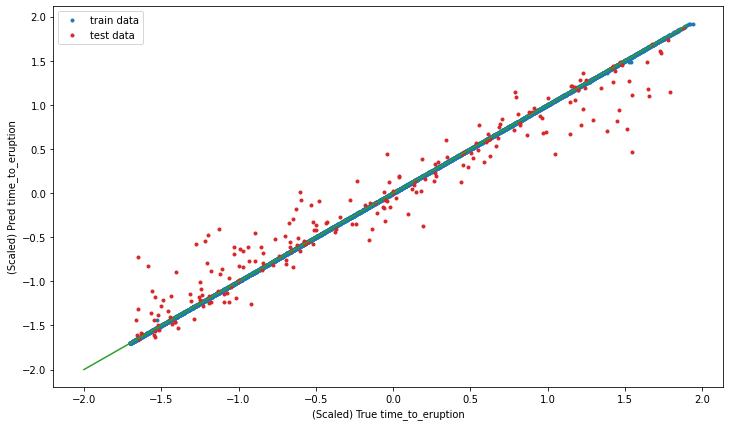

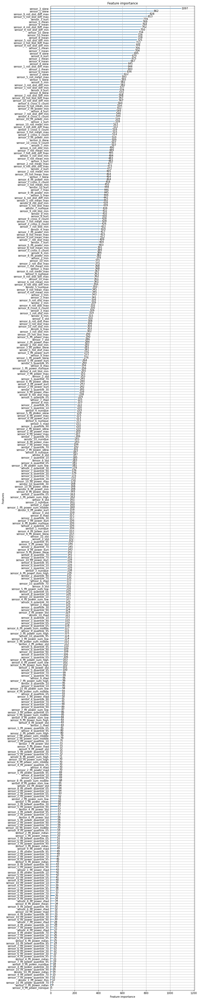

In [15]:
scale_X = StandardScaler()
scale = StandardScaler()


train_X, test_X, train_y, test_y = train_test_split(data.drop(columns=["segment_id","time_to_eruption"]),
                                                    data[["time_to_eruption"]],
                                                    test_size=0.05)


cols = [f"sensor_{i}{_fs}" for i in range(1,11) for _fs in fs]


# Scale X
scaled_train_X = pd.DataFrame(scale_X.fit_transform(train_X[cols]),index=train_X.index,columns=cols)
scaled_test_X  = pd.DataFrame(scale_X.transform(test_X[cols])     ,index=test_X.index ,columns=cols)
scaled_test    = pd.DataFrame(scale_X.transform(test[cols])       ,index=test.index   ,columns=cols)

# Scale y
scaled_train_y = scale.fit_transform(train_y)[:,0]
scaled_test_y  = scale.transform(test_y)[:,0]


# LightGBM parameters
params = {'task' : 'train',
          'boosting_type' : 'gbdt',
          'objective' : 'regression',
          'metric' : 'mae',
          'verbose' : 0}

    
# Create GBM
# create dataset for lightgbm
lgb_train = lgb.Dataset(scaled_train_X, scaled_train_y)
lgb_eval  = lgb.Dataset(scaled_test_X , scaled_test_y , reference=lgb_train)

# Train LightGBM
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=1000,
                valid_sets=[lgb_train, lgb_eval],
                valid_names=["train","test"],
                early_stopping_rounds=30)
print(f"Best Iteration: {gbm.best_iteration}")
print(f"Best Score: {gbm.best_score}")

# Plot Training Results
plt.figure(figsize=(12,7))
plt.plot(scaled_train_y,gbm.predict(scaled_train_X),marker=".",linestyle="",color="tab:blue",label="train data")
plt.plot(scaled_test_y ,gbm.predict(scaled_test_X) ,marker=".",linestyle="",color="tab:red" ,label="test data")
plt.plot(np.arange(-2.0,2.0,0.1),np.arange(-2.0,2.0,0.1),color="tab:green")
plt.legend()
plt.xlabel("(Scaled) True time_to_eruption")
plt.ylabel("(Scaled) Pred time_to_eruption")
plt.show()

# Plot Feature Importance
lgb.plot_importance(gbm,figsize=(10,70))
plt.show()

# Create submission file

In [16]:
submit = pd.DataFrame(scale.inverse_transform(gbm.predict(scaled_test)),
                      index=test["segment_id"],
                      columns=["time_to_eruption"],
                      dtype="int")
submit.clip(lower=0,inplace=True)

display(submit)

submit.to_csv("submission.csv")

!cat submission.csv

,time_to_eruption
segment_id,
662564439,16789299
685365013,32649424
1065071029,30465046
865103237,19076186
135705762,29087313
...,...
512130119,22499495
1084397983,24787640
556524338,1698942


segment_id,time_to_eruption
662564439,16789299
685365013,32649424
1065071029,30465046
865103237,19076186
135705762,29087313
2117536679,27351065
1348208306,26828466
1765653499,35990101
733964800,25064331
494508342,24381691
496852320,21280534
1673625048,15048771
493266452,26605059
1637566181,25483043
2087128303,26420003
686556182,2060816
1948750016,16964379
1700782638,31931588
918796208,21930517
1601435645,23953988
179172057,22948890
200552542,29024703
919268766,23665672
453062780,24030047
1240454739,37430644
1433376354,42084352
1449737778,12913893
233825937,14223955
2138025511,22128777
2002725107,28456892
1079951835,26729000
233175247,10186470
1428927390,5305597
980673729,17582926
1542688402,33981413
750436950,23811076
1006026494,11096408
505902531,30770218
1441922145,14346049
274713689,2556621
1119629515,14920648
1599535626,10301559
914253765,26945743
989967752,31920451
1464067272,4845438
838665652,17600996
1733612481,21949028
1251709691,21770229
964743728,27634782
1440793807,40861113
